In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
%matplotlib inline 

In [2]:
# Install Facebook's Prophet library
!pip install fbprophet

  Using cached fbprophet-0.5.tar.gz (49 kB)
    Running setup.py install for fbprophet ... error
    ERROR: Command errored out with exit status 1:
     command: /Library/Frameworks/Python.framework/Versions/3.6/bin/python3.6 -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/r1/b961zxps7nv843kfwd20xwz40000gn/T/pip-install-o8eakr4t/fbprophet/setup.py'"'"'; __file__='"'"'/private/var/folders/r1/b961zxps7nv843kfwd20xwz40000gn/T/pip-install-o8eakr4t/fbprophet/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' install --record /private/var/folders/r1/b961zxps7nv843kfwd20xwz40000gn/T/pip-record-00y48q0m/install-record.txt --single-version-externally-managed --compile --install-headers /Library/Frameworks/Python.framework/Versions/3.6/include/python3.6m/fbprophet
         cwd: /private/var/folders/r1/b961zxps7nv843kfwd20xwz40000gn/T/pip-ins

In [3]:
# Read file
df=pd.read_csv("database.csv")
events_df = pd.read_csv("database.csv")
print (df.shape)
df.head(5)


(23412, 21)


,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [4]:
print("Earthaquakes data -  rows:",events_df.shape[0]," columns:", events_df.shape[1])

Earthaquakes data -  rows: 23412  columns: 21


In [5]:
events_df.head(5)

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [6]:
events_df['Type'].unique()

array(['Earthquake', 'Nuclear Explosion', 'Explosion', 'Rock Burst'],
      dtype=object)

In [7]:
earthquakes = events_df[events_df['Type']=='Earthquake'].copy()

In [8]:
import datetime

# Extract year for filtering purpose
year = []
for index, row in df.iterrows():
    try:
        date = row['Date']
        date_time_obj = datetime.datetime.strptime(date, '%m/%d/%Y')
        y = date_time_obj.date().year
        year.append(y)
    except:
        year.append(-1)
print (year[:5])

[1965, 1965, 1965, 1965, 1965]


In [9]:
# Insert new column 'Year'
df.insert(loc=1, column='Year', value=year)
df.head(5)

,Date,Year,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic


In [10]:
# Drop unused columns
keep = np.array(['Date', 'Year', 'Latitude', 'Longitude'])
cols = np.array(df.columns)
drop = list(set(cols) - set(keep))
sample = df.drop(drop, axis=1)
sample.head(5)

,Date,Year,Latitude,Longitude
0,01/02/1965,1965,19.246,145.616
1,01/04/1965,1965,1.863,127.352
2,01/05/1965,1965,-20.579,-173.972
3,01/08/1965,1965,-59.076,-23.557
4,01/09/1965,1965,11.938,126.427


In [11]:
recent_sample = sample.loc[sample['Year'] > 2010]
print(recent_sample.shape)
recent_sample.head(5)

(3013, 4)


,Date,Year,Latitude,Longitude
20398,01/01/2011,2011,-26.803,-63.136
20399,01/02/2011,2011,-4.458,101.428
20400,01/02/2011,2011,-38.355,-73.326
20401,01/03/2011,2011,-59.791,149.897
20402,01/05/2011,2011,31.545,142.177


In [12]:
# sabang : 5.883256, 95.329685
# merauke : -8.498532, 140.404580
# miangas : 5.558034, 126.585109
# rote : -10.700417, 123.123475

# Use this to filtering earthquake only at Indonesia

indo_sample = recent_sample.loc[
    (recent_sample['Latitude'] > -10.700417) &
    (recent_sample['Latitude'] < 5.558034) &
    (recent_sample['Longitude'] > 95.329685) &
    (recent_sample['Longitude'] < 140.404580)
]
indo_sample.head(5)

,Date,Year,Latitude,Longitude
20399,01/02/2011,2011,-4.458,101.428
20406,01/08/2011,2011,-0.026,124.913
20421,01/15/2011,2011,2.491,96.280
20422,01/15/2011,2011,-5.650,130.252
20423,01/17/2011,2011,-5.030,102.647


In [13]:
import folium

# create the map.
map_pickup = folium.Map( location=[30.221951, 67.023048], zoom_start=4)
recent_sample.apply(lambda row : folium.CircleMarker(location=[row["Latitude"], row["Longitude"]] ).add_to(map_pickup), axis=1)
map_pickup

In [14]:
lr = {'0': 0.1354364, '1': 0.134567, '2': 0.100000} 

In [15]:
earthquakes["RichterM"] = np.power(earthquakes["Magnitude"],10)

In [16]:
# Ploting number of earthquakes from 2000 to 2016
#d = {}
#for year in range(2000,2017):
#    d[year] = len(sample.loc[sample['Year'] == year])
#plt.figure(figsize=(10, 4))
#plt.plot(d.keys(), d.values())

In [17]:
# Per time-zone
# Greenwich
# Lat : 51.476852
# Lng : -0.000500
# Distance between two time zone is 15 degree (360/24)
# Assume that Greenwhich Lng is 0 therefore longitude range for GMT+0 is -7.5 -> 7.5

In [18]:
gmt_range = {}
c = 0 # GMT+-c
for i in range (0, 180, 15):
    low = i-7.5
    gmt_range[-c] = (-low, (-low) - 15)
    gmt_range[c] = (low, low + 15)
    c += 1
gmt_range[12] = (172.5, -172.5)
gmt_range

{0: (-7.5, 7.5),
 -1: (-7.5, -22.5),
 1: (7.5, 22.5),
 -2: (-22.5, -37.5),
 2: (22.5, 37.5),
 -3: (-37.5, -52.5),
 3: (37.5, 52.5),
 -4: (-52.5, -67.5),
 4: (52.5, 67.5),
 -5: (-67.5, -82.5),
 5: (67.5, 82.5),
 -6: (-82.5, -97.5),
 6: (82.5, 97.5),
 -7: (-97.5, -112.5),
 7: (97.5, 112.5),
 -8: (-112.5, -127.5),
 8: (112.5, 127.5),
 -9: (-127.5, -142.5),
 9: (127.5, 142.5),
 -10: (-142.5, -157.5),
 10: (142.5, 157.5),
 -11: (-157.5, -172.5),
 11: (157.5, 172.5),
 12: (172.5, -172.5)}

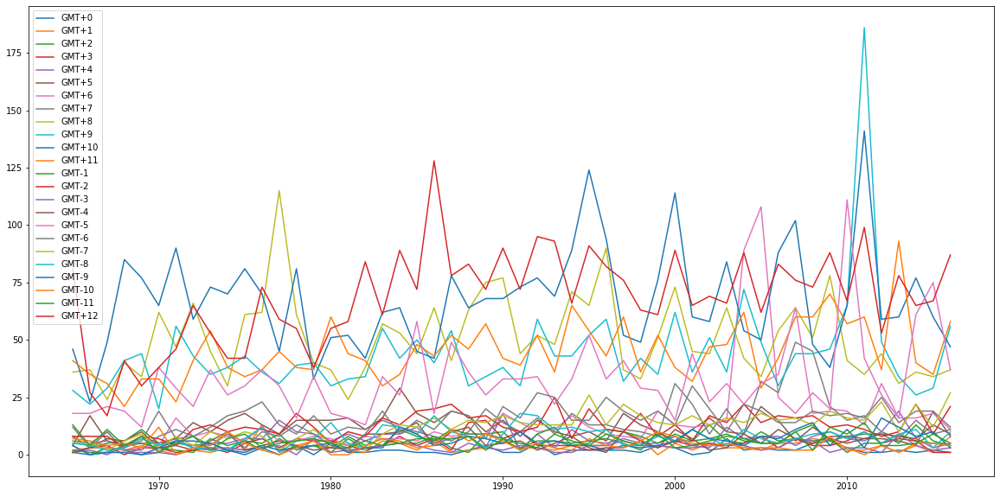

In [19]:
mainFrame = {}
for timezone in range(12):
    tz_range = gmt_range[timezone]
    fbtz = sample.loc[(sample['Longitude'] > tz_range[0]) & (sample['Longitude'] <= tz_range[1])]
    yf = {}
    for year in range(1965,2017):
        fby = fbtz.loc[fbtz['Year'] == year] 
        yf[year] = len(fby)
    mainFrame['GMT+' + str(timezone)] = yf
    
for timezone in range(1,12):
    tz_range = gmt_range[-timezone]
    fbtz = sample.loc[(sample['Longitude'] <= tz_range[0]) & (sample['Longitude'] > tz_range[1])]
    yf = {}
    for year in range(1965,2017):
        fby = fbtz.loc[fbtz['Year'] == year] 
        yf[year] = len(fby)
    mainFrame['GMT-' + str(timezone)] = yf

#GMT+12
tz_range = gmt_range[12]
fbtz = sample.loc[(sample['Longitude'] > tz_range[0]) | (sample['Longitude'] <= tz_range[1])]
yf = {}
for year in range(1965,2017):
    fby = fbtz.loc[fbtz['Year'] == year] 
    yf[year] = len(fby)
mainFrame['GMT+12'] = yf
    
maindf = pd.DataFrame(mainFrame)
maindf.plot.line(figsize=(20, 10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x123a2b990>,
      dtype=object)

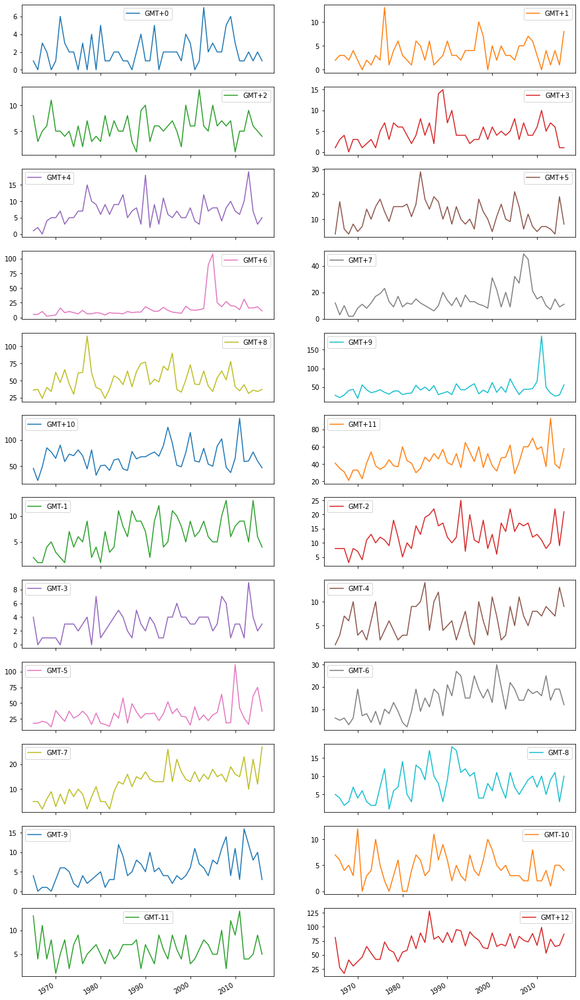

In [20]:
maindf.plot.line(subplots=True, figsize=(15, 30), layout=(12,2))

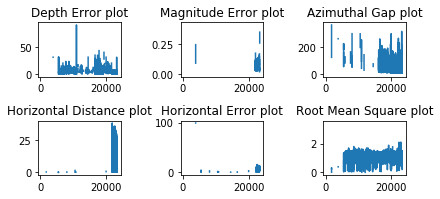

In [21]:
plt.subplot(331)
plt.title("Depth Error plot")
df['Depth Error'].plot()

plt.subplot(332)
plt.title('Magnitude Error plot')
df['Magnitude Error'].plot()

plt.subplot(333)
plt.title('Azimuthal Gap plot')
df['Azimuthal Gap'].plot()

plt.subplot(334)
plt.title('Horizontal Distance plot')
df['Horizontal Distance'].plot()

plt.subplot(335)
plt.title('Horizontal Error plot')
df['Horizontal Error'].plot()

plt.subplot(336)
plt.title('Root Mean Square plot')
df['Root Mean Square'].plot()

plt.tight_layout()

In [22]:
from pandas import DataFrame
from pandas import Series
import matplotlib.pyplot as plt
earthquake_data = pd.read_csv("database.csv")
earthquake_data.shape

(23412, 21)

In [23]:
database = pd.read_csv('database.csv')
database.head(1)

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic


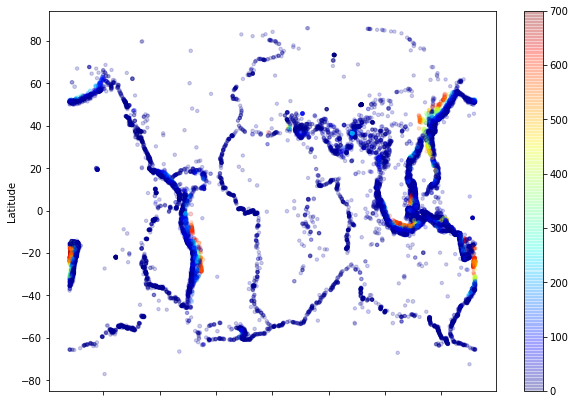

In [24]:
database.plot(kind="scatter", x="Longitude", y="Latitude", alpha=.2, s=database['Magnitude']*2, c=database['Depth'], figsize=(10,7), cmap=plt.get_cmap('jet'))

In [25]:
years = []
for d in database['Date']:
    x = d.split("/")
    if len(x) == 1:
        x = d.split("-")
    if len(x[0]) == 4:
        years += [x[0]]
    else:
        years += [x[2]]

In [26]:
 database['Year'] = years
database['Year'].factorize()

(array([ 0,  0,  0, ..., 51, 51, 51]),
 Index(['1965', '1966', '1967', '1968', '1969', '1970', '1971', '1972', '1973',
        '1974', '1975', '1976', '1977', '1978', '1979', '1980', '1981', '1982',
        '1983', '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991',
        '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999', '2000',
        '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009',
        '2010', '2011', '2012', '2013', '2014', '2015', '2016'],
       dtype='object'))

In [27]:

from plotly.offline import init_notebook_mode, plot, iplot
import plotly as py
init_notebook_mode(connected=True) 
import plotly.graph_objs as go # plotly graphical object

In [28]:
data = pd.read_csv("database.csv")
data = data.drop([3378,7512,20650])
data["year"]= [int(each.split("/")[2]) for each in data.iloc[:,0]]

In [29]:
data.head()

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status,year
0,01/02/1965,13:44:18,19.246,145.616,Earthquake,131.6,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
1,01/04/1965,11:29:49,1.863,127.352,Earthquake,80.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
2,01/05/1965,18:05:58,-20.579,-173.972,Earthquake,20.0,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
3,01/08/1965,18:49:43,-59.076,-23.557,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic,1965
4,01/09/1965,13:32:50,11.938,126.427,Earthquake,15.0,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic,1965


In [30]:
dataset = data.loc[:,["Date","Latitude","Longitude","Type","Depth","Magnitude","year"]]
dataset.head()
years = [str(each) for each in list(data.year.unique())]  # str unique years
# make list of types
types = ['Earthquake', 'Nuclear Explosion', 'Explosion', 'Rock Burst']
custom_colors = {
    'Earthquake': 'rgb(189, 2, 21)',
    'Nuclear Explosion': 'rgb(52, 7, 250)',
    'Explosion': 'rgb(99, 110, 250)',
    'Rock Burst': 'rgb(0, 0, 0)'
}
# make figure
figure = {
    'data': [],
    'layout': {},
    'frames': []
}

figure['layout']['geo'] = dict(showframe=False, showland=True, showcoastlines=True, showcountries=True,
               countrywidth=1, 
              landcolor = 'rgb(217, 217, 217)',
              subunitwidth=1,
              showlakes = True,
              lakecolor = 'rgb(255, 255, 255)',
              countrycolor="rgb(5, 5, 5)")
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '1965',
    'plotlycommand': 'animate',
    'values': years,
    'visible': True
}
figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': False},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Year:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

# make data
year = 1695
for ty in types:
    dataset_by_year = dataset[dataset['year'] == year]
    dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Type'] == ty]
    
    data_dict = dict(
    type='scattergeo',
    lon = dataset['Longitude'],
    lat = dataset['Latitude'],
    hoverinfo = 'text',
    text = ty,
    mode = 'markers',
    marker=dict(
        sizemode = 'area',
        sizeref = 1,
        size= 10 ,
        line = dict(width=1,color = "white"),
        color = custom_colors[ty],
        opacity = 0.7),
)
    figure['data'].append(data_dict)
    
# make frames
for year in years:
    frame = {'data': [], 'name': str(year)}
    for ty in types:
        dataset_by_year = dataset[dataset['year'] == int(year)]
        dataset_by_year_and_cont = dataset_by_year[dataset_by_year['Type'] == ty]

        data_dict = dict(
                type='scattergeo',
                lon = dataset_by_year_and_cont['Longitude'],
                lat = dataset_by_year_and_cont['Latitude'],
                hoverinfo = 'text',
                text = ty,
                mode = 'markers',
                marker=dict(
                    sizemode = 'area',
                    sizeref = 1,
                    size= 10 ,
                    line = dict(width=1,color = "white"),
                    color = custom_colors[ty],
                    opacity = 0.7),
                name = ty
            )
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [year],
        {'frame': {'duration': 300, 'redraw': False},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': year,
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)


figure["layout"]["autosize"]= True
figure["layout"]["title"] = "Earthquake"       

figure['layout']['sliders'] = [sliders_dict]

iplot(figure)

/Users/muhammadkhalid/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



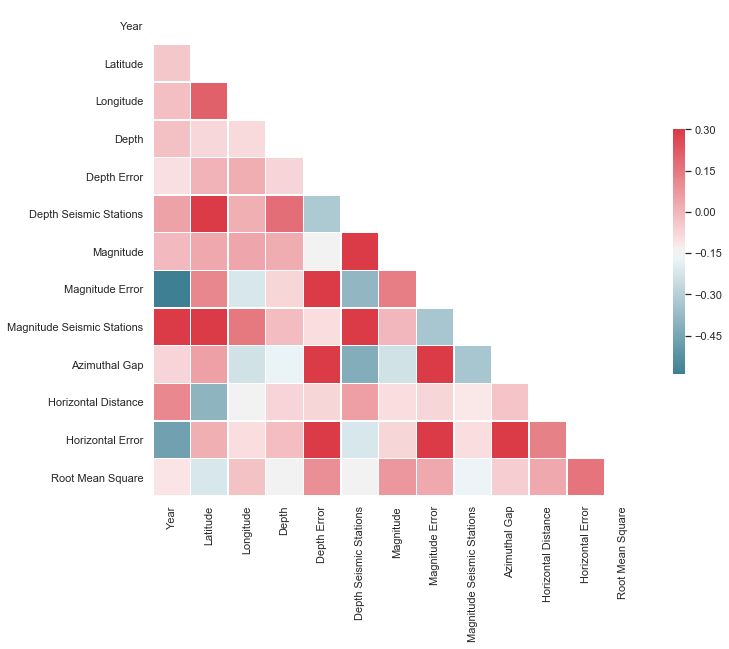

In [31]:
import seaborn as sns
sns.set(style="white")

corr = df.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3,
            square=True, #xticklabels=5, yticklabels=5,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)